In [3]:
# =========================
# Standard library
# =========================
from pathlib import Path
import random
import statistics as stats
from collections import Counter, defaultdict

# =========================
# Image processing & visualization
# =========================
from PIL import Image
import matplotlib.pyplot as plt

# =========================
# PyTorch core
# =========================
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# =========================
# PyTorch data utilities
# =========================
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# =========================
# Training utilities
# =========================
from tqdm import tqdm


# =========================
# Evaluation & metrics
# =========================
import numpy as np
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    accuracy_score,
    precision_recall_fscore_support
)


# Loading Image and display sample


TRAIN SPLIT
-----------

Per-folder counts:
freshapples     : 1693
freshbanana     : 1581
freshoranges    : 1466
rottenapples    : 2342
rottenbanana    : 2224
rottenoranges   : 1595
unripe apple    : 1934
unripe banana   : 2097
unripe orange   : 1285

Fruit x Stage counts:
                 fresh    unripe    rotten
apple             1693      1934      2342
banana            1581      2097      2224
orange            1466      1285      1595

Total images: 16217

TEST SPLIT
----------

Per-folder counts:
freshapples     : 395
freshbanana     : 381
freshoranges    : 388
rottenapples    : 601
rottenbanana    : 530
rottenoranges   : 403
unripe apple    : 371
unripe banana   : 400
unripe orange   : 270

Fruit x Stage counts:
                 fresh    unripe    rotten
apple              395       371       601
banana             381       400       530
orange             388       270       403

Total images: 3739

TRAIN: size/aspect analysis
---------------------------
Scanned: 16217, OK:

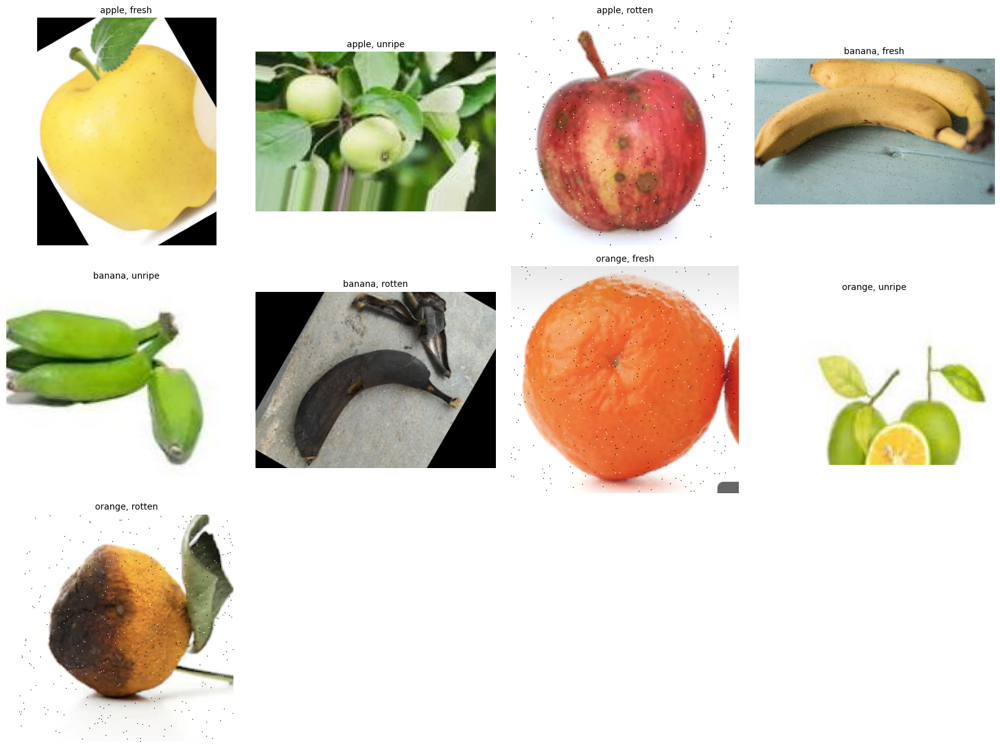

In [4]:
# =========================
# Loading images + quick dataset checks
# (counts, size/aspect, imbalance, sample grid)
# =========================

# dataset config
DATA_ROOT = Path("/kaggle/input/fruit-ripeness-unripe-ripe-and-rotten/fruit_ripeness_dataset/archive (1)/dataset")
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

FRUITS = ["apple", "banana", "orange"]
STAGES = ["fresh", "unripe", "rotten"]


def make_label_maps(fruits, stages):
    # stable ids for labels
    fruit_to_id = {f: i for i, f in enumerate(fruits)}
    stage_to_id = {s: i for i, s in enumerate(stages)}
    return fruit_to_id, stage_to_id


fruit_to_id, stage_to_id = make_label_maps(FRUITS, STAGES)


def is_image_file(p: Path, exts=IMG_EXTS) -> bool:
    return p.is_file() and p.suffix.lower() in exts


def parse_labels_from_folder(folder_name: str, fruits=FRUITS):
    name = folder_name.strip().lower()

    # stage from prefix
    if name.startswith("fresh"):
        stage = "fresh"
    elif name.startswith("rotten"):
        stage = "rotten"
    elif name.startswith("unripe"):
        stage = "unripe"
    else:
        raise ValueError(f"Cannot parse stage from folder: {folder_name}")

    # fruit from substring (handles apples/oranges plurals)
    fruit = None
    for f in fruits:
        if f in name:
            fruit = f
            break

    if fruit is None:
        raise ValueError(f"Cannot parse fruit from folder: {folder_name}")

    return fruit, stage


def load_split_items(split_dir: Path, fruit_to_id, stage_to_id):
    # scans folders like freshapples/rottenbanana/...
    class_dirs = sorted([p for p in split_dir.iterdir() if p.is_dir()])
    items = []

    for cls_dir in class_dirs:
        folder = cls_dir.name
        fruit, stage = parse_labels_from_folder(folder)

        for img_path in cls_dir.rglob("*"):
            if is_image_file(img_path):
                items.append({
                    "path": str(img_path),
                    "folder": folder,
                    "fruit": fruit,
                    "fruit_id": fruit_to_id[fruit],
                    "stage": stage,
                    "stage_id": stage_to_id[stage],
                })

    return items


def print_count_table(items, title="Counts"):
    table = defaultdict(int)
    folder_counts = defaultdict(int)

    for it in items:
        table[(it["fruit"], it["stage"])] += 1
        folder_counts[it["folder"]] += 1

    print(f"\n{title}")
    print("-" * len(title))

    print("\nPer-folder counts:")
    for folder in sorted(folder_counts.keys()):
        print(f"{folder:15s} : {folder_counts[folder]}")

    print("\nFruit x Stage counts:")
    header = " " * 12 + "".join([f"{s:>10s}" for s in STAGES])
    print(header)

    for f in FRUITS:
        row = f"{f:12s}"
        for s in STAGES:
            row += f"{table[(f, s)]:10d}"
        print(row)

    print("\nTotal images:", len(items))


def image_size_aspect_analysis(items, title="Image size / aspect analysis", max_scan=None):
    paths = [it["path"] for it in items]
    if max_scan is not None:
        paths = paths[:max_scan]

    widths, heights, ratios = [], [], []
    size_counter = Counter()
    failed = 0

    for p in paths:
        try:
            with Image.open(p) as im:
                w, h = im.size
        except Exception:
            failed += 1
            continue

        widths.append(w)
        heights.append(h)
        ratios.append(w / h if h != 0 else 0.0)
        size_counter[(w, h)] += 1

    total = len(paths)
    ok = len(widths)

    print(f"\n{title}")
    print("-" * len(title))
    print(f"Scanned: {total}, OK: {ok}, Failed: {failed}")

    if ok == 0:
        print("No valid images found.")
        return

    def print_stats(name, arr):
        arr_sorted = sorted(arr)
        print(f"\n{name}:")
        print(f"  min   : {arr_sorted[0]}")
        print(f"  max   : {arr_sorted[-1]}")
        print(f"  mean  : {stats.mean(arr):.2f}")
        print(f"  median: {stats.median(arr):.2f}")

    print_stats("Width (px)", widths)
    print_stats("Height (px)", heights)
    print_stats("Aspect ratio (w/h)", ratios)

    portrait = sum(1 for r in ratios if r < 0.95)
    square = sum(1 for r in ratios if 0.95 <= r <= 1.05)
    landscape = sum(1 for r in ratios if r > 1.05)

    print("\nOrientation split (approx):")
    print(f"  portrait : {portrait} ({portrait/ok*100:.1f}%)")
    print(f"  square   : {square} ({square/ok*100:.1f}%)")
    print(f"  landscape: {landscape} ({landscape/ok*100:.1f}%)")

    print("\nMost common image sizes (top 10):")
    for (w, h), c in size_counter.most_common(10):
        print(f"  {w:4d}x{h:4d} : {c}")


def class_imbalance_summary(items, title="Class imbalance summary"):
    """
    Print class distribution statistics to identify imbalance issues.
    """
    fruit_counts = defaultdict(int)
    stage_counts = defaultdict(int)
    combo_counts = defaultdict(int)

    for it in items:
        fruit_counts[it["fruit"]] += 1
        stage_counts[it["stage"]] += 1
        combo_counts[(it["fruit"], it["stage"])] += 1

    total = len(items)

    print(f"\n{title}")
    print("-" * len(title))
    print("Total images:", total)

    def print_dist(name, dct):
        print(f"\n{name}:")
        rows = sorted(dct.items(), key=lambda x: (-x[1], str(x[0])))
        for k, v in rows:
            print(f"  {str(k):15s} : {v:5d} ({v/total*100:5.1f}%)")

        vals = [v for _, v in rows]
        if vals:
            ratio = max(vals) / max(1, min(vals))
            print(f"  imbalance ratio (max/min): {ratio:.2f}")

    print_dist("Fruit distribution", fruit_counts)
    print_dist("Stage distribution", stage_counts)

    print("\nFruit x Stage distribution:")
    header = " " * 12 + "".join([f"{s:>10s}" for s in STAGES])
    print(header)

    for f in FRUITS:
        row = f"{f:12s}"
        for s in STAGES:
            row += f"{combo_counts[(f, s)]:10d}"
        print(row)

    combo_vals = list(combo_counts.values())
    if combo_vals:
        print("\nCombo imbalance ratio (max/min):", f"{max(combo_vals)/max(1, min(combo_vals)):.2f}")


def pick_samples(items, mode="per_combo", seed=42, max_n=12):
    rng = random.Random(seed)

    if not items:
        return []

    if mode == "random":
        k = min(len(items), max_n)
        return rng.sample(items, k=k)

    buckets = defaultdict(list)
    for it in items:
        buckets[(it["fruit"], it["stage"])].append(it)

    chosen = []
    for f in FRUITS:
        for s in STAGES:
            bucket = buckets.get((f, s), [])
            if bucket:
                chosen.append(rng.choice(bucket))

    return chosen


def show_samples(items, mode="per_combo", cols=4, seed=42, max_n=12):
    chosen = pick_samples(items, mode=mode, seed=seed, max_n=max_n)

    if not chosen:
        print("No images to display.")
        return

    rows = (len(chosen) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, it in enumerate(chosen, start=1):
        img = Image.open(it["path"]).convert("RGB")
        ax = plt.subplot(rows, cols, i)
        ax.imshow(img)
        ax.set_title(f'{it["fruit"]}, {it["stage"]}', fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ---- Run for Train + Test ----
train_items = load_split_items(DATA_ROOT / "train", fruit_to_id, stage_to_id)
test_items  = load_split_items(DATA_ROOT / "test",  fruit_to_id, stage_to_id)

print_count_table(train_items, title="TRAIN SPLIT")
print_count_table(test_items,  title="TEST SPLIT")

image_size_aspect_analysis(train_items, title="TRAIN: size/aspect analysis", max_scan=None)
image_size_aspect_analysis(test_items,  title="TEST: size/aspect analysis",  max_scan=None)

class_imbalance_summary(train_items, title="TRAIN: imbalance summary")
class_imbalance_summary(test_items,  title="TEST: imbalance summary")

show_samples(train_items, mode="per_combo", cols=4, seed=42)

# Dataset Pipeline (Split → Augment → Loader)

In [5]:
# =========================
# Train/Val Split + Dataset + DataLoaders
# =========================

def stratified_split(items, val_frac=0.1, seed=42):
    # keeps fruit x stage distribution similar in train and val
    rng = random.Random(seed)

    buckets = defaultdict(list)
    for it in items:
        key = (it["fruit_id"], it["stage_id"])
        buckets[key].append(it)

    train_out, val_out = [], []
    for _, bucket in buckets.items():
        rng.shuffle(bucket)

        n_val = max(1, int(len(bucket) * val_frac))
        val_out.extend(bucket[:n_val])
        train_out.extend(bucket[n_val:])

    rng.shuffle(train_out)
    rng.shuffle(val_out)
    return train_out, val_out


class FruitRipenessDataset(Dataset):
    """
    Custom PyTorch Dataset for fruit ripeness experiments in a discretized state

    Each sample returns:
        image tensor
        fruit label (categorical)
        ripeness stage label (ordinal category)
    """
    def __init__(self, items, transform=None):
        self.items = items
        self.transform = transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        """
        Loads the image and associated labels
        """
        it = self.items[idx]

        img = Image.open(it["path"]).convert("RGB")
        if self.transform:
            img = self.transform(img)

        fruit_id = it["fruit_id"]  # refers to type of fruit
        stage_id = it["stage_id"]  # refers to ripeness stage

        # return as tensors so DataLoader stacks correctly
        return img, torch.tensor(fruit_id, dtype=torch.long), torch.tensor(stage_id, dtype=torch.long)


def build_transforms(img_size=224):
    # train has augmentation, val/test are stable
    train_tfms = transforms.Compose([
        transforms.Resize(256),

        # Crop
        transforms.RandomResizedCrop(img_size, scale=(0.75, 1.0)),

        # basic aug
        transforms.RandomHorizontalFlip(p=0.5),
        
        transforms.RandomRotation(degrees=25),

        # lighting changes
        transforms.ColorJitter(
            brightness=0.3,
            contrast=0.2,
            saturation=0.2
        ),

        transforms.RandomAffine(
            degrees=0,               # rotation already done above
            translate=(0.05, 0.05),
            scale=(0.9, 1.1),
            shear=5
        ),
 
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

    eval_tfms = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

    return train_tfms, eval_tfms


def make_datasets(train_items, test_items, val_frac=0.1, seed=42, img_size=224):
    train_tfms, eval_tfms = build_transforms(img_size=img_size)

    train_items2, val_items = stratified_split(train_items, val_frac=val_frac, seed=seed)

    ds_train = FruitRipenessDataset(train_items2, transform=train_tfms)
    ds_val   = FruitRipenessDataset(val_items,    transform=eval_tfms)
    ds_test  = FruitRipenessDataset(test_items,   transform=eval_tfms)

    return ds_train, ds_val, ds_test, train_items2, val_items


def make_loaders(ds_train, ds_val, ds_test, batch_size=64, num_workers=2):
    # Kaggle sometimes throws multiprocessing warnings; if it happens set num_workers=0
    train_loader = DataLoader(ds_train, batch_size=batch_size, shuffle=True,
                              num_workers=num_workers, pin_memory=True)
    val_loader   = DataLoader(ds_val,   batch_size=batch_size, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    test_loader  = DataLoader(ds_test,  batch_size=batch_size, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    return train_loader, val_loader, test_loader

In [6]:
# make datasets
# ---- build everything ----
VAL_FRAC = 0.1
SEED = 42
IMG_SIZE = 224

ds_train, ds_val, ds_test, train_items2, val_items = make_datasets(
    train_items=train_items,
    test_items=test_items,
    val_frac=VAL_FRAC,
    seed=SEED,
    img_size=IMG_SIZE
)

In [7]:
# make loaders

BATCH_SIZE = 64
# num_workers is set to 0, because kaggle behave wierd when set to otherwise
train_loader, val_loader, test_loader = make_loaders(
    ds_train, ds_val, ds_test,
    batch_size=BATCH_SIZE,
    num_workers=0
)

print("Train:", len(ds_train), "Val:", len(ds_val), "Test:", len(ds_test))

Train: 14599 Val: 1618 Test: 3739


# DataLoader preview

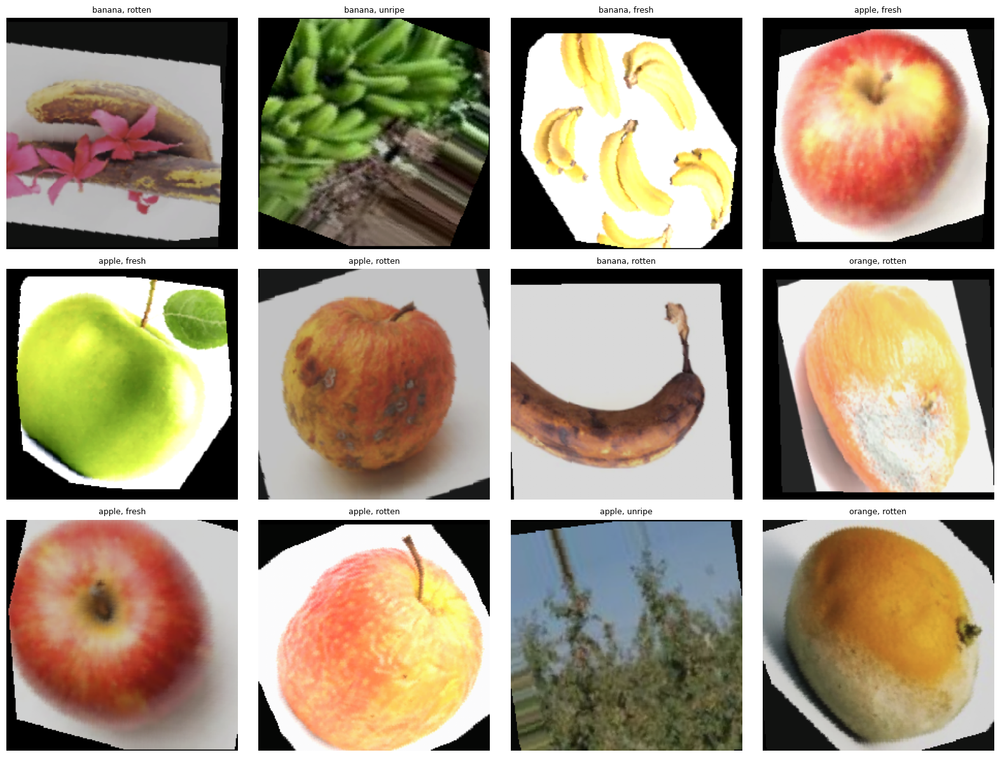

In [8]:
# =========================
# Visual sanity check (denormalize + show a batch)
# =========================

def make_inv_normalize(mean, std):
    # undo Normalize(mean, std)
    inv_mean = [-m / s for m, s in zip(mean, std)]
    inv_std  = [1 / s for s in std]
    return transforms.Normalize(mean=inv_mean, std=inv_std)


INV_NORM = make_inv_normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)


def show_batch(loader, fruits, stages, inv_norm=None, n=12, cols=4, seed=None):
    if seed is not None:
        random.seed(seed)

    x, fruit_y, stage_y = next(iter(loader))
    n = min(n, x.size(0))

    rows = (n + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i in range(n):
        img = x[i]
        if inv_norm is not None:
            img = inv_norm(img)

        img = img.clamp(0, 1).permute(1, 2, 0).numpy()

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(f"{fruits[fruit_y[i].item()]}, {stages[stage_y[i].item()]}", fontsize=9)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


show_batch(train_loader, FRUITS, STAGES, inv_norm=INV_NORM, n=12, cols=4)

# Evaluation Metrics

In [9]:
# -------------------------
# Metrics + Confusion matrix helpers
# -------------------------

def print_classification_metrics(y_true, y_pred, class_names, title=""):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    acc = accuracy_score(y_true, y_pred)
    p, r, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )

    if title:
        print(f"\n{title}")
        print("-" * len(title))

    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {p:.4f} (macro)")
    print(f"Recall:    {r:.4f} (macro)")
    print(f"F1-score:  {f1:.4f} (macro)")

    print("\nClassification report (per class):")
    print(classification_report(
        y_true, y_pred,
        target_names=class_names,
        zero_division=0
    ))


def plot_confusion(y_true, y_pred, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(ax=ax, values_format="d")
    plt.xticks(rotation=45)
    plt.title(title)
    plt.show()


# -------------------------
# Collect predictions (reusable)
# -------------------------

@torch.inference_mode()
def collect_multitask_regression_outputs(model, loader, device, stage_id_to_score):
    """
    Collect predictions and ground-truth labels for the entire dataset.

    Used for:
        - Confusion matrices
        - Ripeness score distributions
        - Error visualization

    Assumes:
        DataLoader has shuffle=False so dataset indices remain consistent.
    """
    model.eval()

    fruit_true, fruit_pred = [], []
    stage_true, stage_pred = [], []
    rip_true, rip_pred = [], []
    ds_indices = []

    # important: this assumes shuffle=False so indices match dataset order
    seen = 0

    pbar = tqdm(loader, desc="Collect (test)", leave=False)
    for imgs, fruit_y, stage_y in pbar:
        b = imgs.size(0)

        imgs = imgs.to(device)
        fruit_y = fruit_y.to(device)
        stage_y = stage_y.to(device)

        fruit_logits, ripeness = model(imgs)

        f_pred = torch.argmax(fruit_logits, dim=1)
        s_pred = stage_from_score(ripeness, stage_id_to_score)
        r_true = stage_id_to_score[stage_y]

        fruit_true.extend(fruit_y.cpu().tolist())
        fruit_pred.extend(f_pred.cpu().tolist())

        stage_true.extend(stage_y.cpu().tolist())
        stage_pred.extend(s_pred.cpu().tolist())

        rip_true.extend(r_true.cpu().tolist())
        rip_pred.extend(ripeness.cpu().tolist())

        ds_indices.extend(list(range(seen, seen + b)))
        seen += b

    return {
        "fruit_true": np.array(fruit_true),
        "fruit_pred": np.array(fruit_pred),
        "stage_true": np.array(stage_true),
        "stage_pred": np.array(stage_pred),
        "rip_true": np.array(rip_true, dtype=np.float32),
        "rip_pred": np.array(rip_pred, dtype=np.float32),
        "ds_indices": np.array(ds_indices)
    }


# -------------------------
# Ripeness score plots
# -------------------------

def plot_ripeness_histograms(rip_true, rip_pred, stage_true, stages):
    plt.figure(figsize=(9, 5))
    for sid, stage_name in enumerate(stages):
        mask = (stage_true == sid)
        if mask.sum() == 0:
            continue
        plt.hist(rip_pred[mask], bins=30, alpha=0.6, label=f"true={stage_name}")
    plt.title("Predicted ripeness score distribution (grouped by true stage)")
    plt.xlabel("Predicted ripeness score")
    plt.ylabel("Count")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_true_vs_pred_scatter(rip_true, rip_pred):
    plt.figure(figsize=(6, 5))
    plt.scatter(rip_true, rip_pred, s=10, alpha=0.6)
    plt.title("True score vs Predicted score")
    plt.xlabel("True score (0.0 / 0.5 / 1.0)")
    plt.ylabel("Predicted score (0..1)")
    plt.grid(True)
    plt.show()


# -------------------------
# Error galleries (worst MAE + wrong fruit)
# -------------------------

def show_gallery_from_indices(loader, indices, fruits, stages, inv_norm=None, cols=4, title=""):
    ds = loader.dataset
    n = len(indices)
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(cols * 4, rows * 4))
    if title:
        plt.suptitle(title)

    for i, ds_idx in enumerate(indices):
        x, fruit_y, stage_y = ds[int(ds_idx)]

        if inv_norm is not None:
            x = inv_norm(x)

        img = x.clamp(0, 1).permute(1, 2, 0).numpy()

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(f"T: {fruits[fruit_y.item()]}, {stages[stage_y.item()]}", fontsize=9)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def show_top_mae_errors(outputs, loader, fruits, stages, inv_norm=None, k=12):
    """
    Visualize samples with the largest ripeness prediction errors.
    """
    abs_err = np.abs(outputs["rip_pred"] - outputs["rip_true"])
    worst = np.argsort(-abs_err)[:k]
    worst_ds_idx = outputs["ds_indices"][worst]
    show_gallery_from_indices(loader, worst_ds_idx, fruits, stages, inv_norm=inv_norm, title="Worst ripeness errors (by MAE)")


def show_wrong_fruit(outputs, loader, fruits, stages, inv_norm=None, k=12):
    wrong = np.where(outputs["fruit_pred"] != outputs["fruit_true"])[0]
    if len(wrong) == 0:
        print("No wrong fruit predictions found.")
        return

    pick = wrong[:k]
    pick_ds_idx = outputs["ds_indices"][pick]
    show_gallery_from_indices(loader, pick_ds_idx, fruits, stages, inv_norm=inv_norm, title="Wrong fruit predictions")


# -------------------------
# One-call evaluation runner
# -------------------------

def evaluate_report_ready_regression(model, test_loader, device, stage_id_to_score, fruits, stages, inv_norm=None):
    outputs = collect_multitask_regression_outputs(model, test_loader, device, stage_id_to_score)

    # fruit confusion + report
    print_classification_metrics(outputs["fruit_true"], outputs["fruit_pred"], fruits, title="Fruit classification")
    plot_confusion(outputs["fruit_true"], outputs["fruit_pred"], fruits, title="Fruit confusion matrix")

    # stage confusion + report (stage came from score -> stage_from_score)
    print_classification_metrics(outputs["stage_true"], outputs["stage_pred"], stages, title="Stage classification (from regression score)")
    plot_confusion(outputs["stage_true"], outputs["stage_pred"], stages, title="Stage confusion matrix")

    # score plots
    plot_ripeness_histograms(outputs["rip_true"], outputs["rip_pred"], outputs["stage_true"], stages)
    plot_true_vs_pred_scatter(outputs["rip_true"], outputs["rip_pred"])

    # error galleries
    show_top_mae_errors(outputs, test_loader, fruits, stages, inv_norm=inv_norm, k=12)
    show_wrong_fruit(outputs, test_loader, fruits, stages, inv_norm=inv_norm, k=12)

    return outputs

# Creating Baseline Model

In [20]:
# =========================
# Baseline training loop (multitask + regression)
# =========================

def get_device():
    d = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Device:", d)
    return d


def make_stage_id_to_score(stages, device):
    # stage -> score (you can change values later if needed)
    score_map = {"unripe": 0.0, "fresh": 0.5, "rotten": 1.0}
    scores = [score_map[s] for s in stages]
    return torch.tensor(scores, dtype=torch.float32, device=device)


def accuracy_from_logits(logits, y_true):
    y_pred = torch.argmax(logits, dim=1)
    return (y_pred == y_true).float().mean().item()


def stage_from_score(ripeness_score, stage_id_to_score):
    """
    Convert continuous ripeness predictions back to discrete stages.

    Assigns each prediction to the nearest predefined ripeness level:
        {0.0, 0.5, 1.0}

    This allows direct comparison with classification-based baselines.
    """
    diff = (ripeness_score.unsqueeze(1) - stage_id_to_score.unsqueeze(0)).abs()
    return torch.argmin(diff, dim=1)


class BaselineCNN(nn.Module):
    """
    Baseline multi-task CNN trained from scratch.

    Tasks:
        1) Fruit classification (categorical)
        2) Ripeness regression (continuous score in [0, 1])

    Architecture:
        - Shared convolutional feature extractor
        - Separate task-specific heads for fruit and ripeness

    Purpose:
        Serves as a reference model to evaluate the benefit
        of deeper architectures and transfer learning.
    """
    def __init__(self, num_fruits=3, dropout_p=0.2):
        super().__init__()

        self.features = nn.Sequential(
            # Layer 1 => Handle stuff like Edges
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            # Layer 2 => Handle stuff like Textures
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            # Layer 3 => Handle stuff like Patterns
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            # Layer 4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),

            
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            
            # Global Average Pool
            nn.AdaptiveAvgPool2d((1, 1))
        )
        
        # Shared Feature Vector (fruit)
        self.fruit_head = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(p=dropout_p),
            nn.Linear(256, num_fruits)
        )
        
        # Shared Feature Vector (ripeness): outputs a score in [0, 1]
        self.ripeness_head = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(p=dropout_p),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )


    def forward(self, x):
        """
        Returns:
            fruit_logits (Tensor): unnormalized class scores for fruit prediction
            ripeness (Tensor): continuous ripeness score in [0, 1]
        """
        x = self.features(x)
        x = x.view(x.size(0), -1)

        fruit_logits = self.fruit_head(x)
        ripeness = self.ripeness_head(x).squeeze(1)
        return fruit_logits, ripeness


def run_one_epoch(model, loader, device, stage_id_to_score,
                  loss_fruit_fn, loss_reg_fn, alpha=1.0,
                  optimizer=None, desc="Train"):
    """
    Run a single training or evaluation epoch.

    Supports both training and validation modes depending on
    whether an optimizer is provided.

    Computes:
        - Total loss (classification + regression)
        - Fruit classification accuracy
        - Stage accuracy derived from regression output
        - Mean Absolute Error (MAE) for ripeness score
        - Joint accuracy (fruit AND stage correct)

    Returns:
        Dictionary of averaged metrics for logging.
    """
    is_train = optimizer is not None
    model.train() if is_train else model.eval()

    total_loss = 0.0
    total_fruit_acc = 0.0
    total_stage_acc = 0.0
    total_joint_acc = 0.0
    total_mae = 0.0
    n_batches = 0

    pbar = tqdm(loader, desc=desc, leave=False)
    for imgs, fruit_y, stage_y in pbar:
        imgs = imgs.to(device)
        fruit_y = fruit_y.to(device)
        stage_y = stage_y.to(device)

        if is_train:
            optimizer.zero_grad()

        with torch.set_grad_enabled(is_train):
            fruit_logits, ripeness_pred = model(imgs)

            # Convert discrete stage labels to continuous ripeness targets
            ripeness_true = stage_id_to_score[stage_y]

            loss_fruit = loss_fruit_fn(fruit_logits, fruit_y)
            loss_reg = loss_reg_fn(ripeness_pred, ripeness_true)
            loss = loss_fruit + alpha * loss_reg

            if is_train:
                loss.backward()
                optimizer.step()

        fruit_acc = accuracy_from_logits(fruit_logits, fruit_y)

        stage_pred = stage_from_score(ripeness_pred, stage_id_to_score)
        stage_acc = (stage_pred == stage_y).float().mean().item()

        fruit_pred = torch.argmax(fruit_logits, dim=1)
        joint_acc = ((fruit_pred == fruit_y) & (stage_pred == stage_y)).float().mean().item()

        mae = (ripeness_pred - ripeness_true).abs().mean().item()

        total_loss += loss.item()
        total_fruit_acc += fruit_acc
        total_stage_acc += stage_acc
        total_joint_acc += joint_acc
        total_mae += mae
        n_batches += 1

        pbar.set_postfix({
            "loss": f"{loss.item():.3f}",
            "fruit_acc": f"{fruit_acc:.3f}",
            "stage_acc": f"{stage_acc:.3f}",
            "mae": f"{mae:.3f}",
            "joint_acc": f"{joint_acc:.3f}"
        })

    return {
        "loss": total_loss / max(1, n_batches),
        "fruit_acc": total_fruit_acc / max(1, n_batches),
        "stage_acc": total_stage_acc / max(1, n_batches),
        "mae": total_mae / max(1, n_batches),
        "joint_acc": total_joint_acc / max(1, n_batches),
    }


def print_metrics(prefix, m):
    print(
        f"{prefix}: loss={m['loss']:.3f}, fruit_acc={m['fruit_acc']:.3f}, "
        f"stage_acc={m['stage_acc']:.3f}, mae={m['mae']:.3f}, joint_acc={m['joint_acc']:.3f}"
    )


def fit_model(train_loader, val_loader, test_loader,
              fruits, stages,epochs=5, alpha=1.0, lr=1e-3,
              best_path="multitask_regression.pth"):
    device = get_device()
    stage_id_to_score = make_stage_id_to_score(stages, device)

    model = BaselineCNN(num_fruits=len(fruits)).to(device)

    loss_fruit_fn = nn.CrossEntropyLoss()
    loss_reg_fn = nn.MSELoss()
    #optimizer = optim.Adam(model.parameters(), lr=lr)
    optimizer = optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=1e-4
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=epochs,   # total number of epochs
        eta_min=1e-5
    )

    best_val_joint = -1.0

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_m = run_one_epoch(
            model, train_loader, device, stage_id_to_score,
            loss_fruit_fn, loss_reg_fn, alpha=alpha,
            optimizer=optimizer, desc="Train"
        )

        val_m = run_one_epoch(
            model, val_loader, device, stage_id_to_score,
            loss_fruit_fn, loss_reg_fn, alpha=alpha,
            optimizer=None, desc="Val"
        )

        print_metrics("Train", train_m)
        print_metrics("Val  ", val_m)

        if val_m["joint_acc"] > best_val_joint:
            best_val_joint = val_m["joint_acc"]
            torch.save(model.state_dict(), best_path)
            print("Saved best model:", best_path)

        # learning rate decay
        scheduler.step()
        print(f"LR now: {optimizer.param_groups[0]['lr']:.6f}")

    # test best checkpoint
    model.load_state_dict(torch.load(best_path, map_location=device))

    test_m = run_one_epoch(
        model, test_loader, device, stage_id_to_score,
        loss_fruit_fn, loss_reg_fn, alpha=alpha,
        optimizer=None, desc="Test"
    )

    print("\nBaseline test results:")
    print_metrics("Test", test_m)

    return model, test_m, device, stage_id_to_score

# Baseline evaluation (evidence + visuals)

Device: cuda

Epoch 1/10


Train: loss=0.707, fruit_acc=0.716, stage_acc=0.716, mae=0.189, joint_acc=0.509
Val  : loss=0.668, fruit_acc=0.725, stage_acc=0.797, mae=0.156, joint_acc=0.572
Saved best model: baseline_model.pth
LR now: 0.000976

Epoch 2/10


Train: loss=0.591, fruit_acc=0.769, stage_acc=0.800, mae=0.148, joint_acc=0.617
Val  : loss=0.852, fruit_acc=0.688, stage_acc=0.773, mae=0.151, joint_acc=0.539
LR now: 0.000905

Epoch 3/10


Train: loss=0.519, fruit_acc=0.795, stage_acc=0.830, mae=0.129, joint_acc=0.660
Val  : loss=0.657, fruit_acc=0.748, stage_acc=0.837, mae=0.128, joint_acc=0.628
Saved best model: baseline_model.pth
LR now: 0.000796

Epoch 4/10


Train: loss=0.472, fruit_acc=0.811, stage_acc=0.861, mae=0.110, joint_acc=0.699
Val  : loss=0.533, fruit_acc=0.794, stage_acc=0.787, mae=0.140, joint_acc=0.611
LR now: 0.000658

Epoch 5/10


Train: loss=0.442, fruit_acc=0.824, stage_acc=0.871, mae=0.103, joint_acc=0.721
Val  : loss=0.448, fruit_acc=0.819, stage_acc=0.888, mae=0.093, joint_acc=0.723
Saved best model: baseline_model.pth
LR now: 0.000505

Epoch 6/10


Train: loss=0.403, fruit_acc=0.840, stage_acc=0.892, mae=0.089, joint_acc=0.751
Val  : loss=0.366, fruit_acc=0.847, stage_acc=0.910, mae=0.075, joint_acc=0.768
Saved best model: baseline_model.pth
LR now: 0.000352

Epoch 7/10


Train: loss=0.354, fruit_acc=0.858, stage_acc=0.909, mae=0.078, joint_acc=0.779
Val  : loss=0.345, fruit_acc=0.877, stage_acc=0.898, mae=0.083, joint_acc=0.782
Saved best model: baseline_model.pth
LR now: 0.000214

Epoch 8/10


Train: loss=0.329, fruit_acc=0.870, stage_acc=0.917, mae=0.074, joint_acc=0.798
Val  : loss=0.302, fruit_acc=0.878, stage_acc=0.940, mae=0.060, joint_acc=0.824
Saved best model: baseline_model.pth
LR now: 0.000105

Epoch 9/10


Train: loss=0.298, fruit_acc=0.884, stage_acc=0.931, mae=0.065, joint_acc=0.823
Val  : loss=0.273, fruit_acc=0.891, stage_acc=0.955, mae=0.048, joint_acc=0.850
Saved best model: baseline_model.pth
LR now: 0.000034

Epoch 10/10


Train: loss=0.286, fruit_acc=0.890, stage_acc=0.933, mae=0.063, joint_acc=0.830
Val  : loss=0.264, fruit_acc=0.899, stage_acc=0.956, mae=0.052, joint_acc=0.856
Saved best model: baseline_model.pth
LR now: 0.000010



Baseline test results:
Test: loss=0.214, fruit_acc=0.922, stage_acc=0.950, mae=0.055, joint_acc=0.875



Fruit classification
--------------------
Accuracy:  0.9240
Precision: 0.9260 (macro)
Recall:    0.9226 (macro)
F1-score:  0.9240 (macro)

Classification report (per class):
              precision    recall  f1-score   support

       apple       0.89      0.94      0.91      1367
      banana       0.95      0.93      0.94      1311
      orange       0.93      0.90      0.92      1061

    accuracy                           0.92      3739
   macro avg       0.93      0.92      0.92      3739
weighted avg       0.93      0.92      0.92      3739



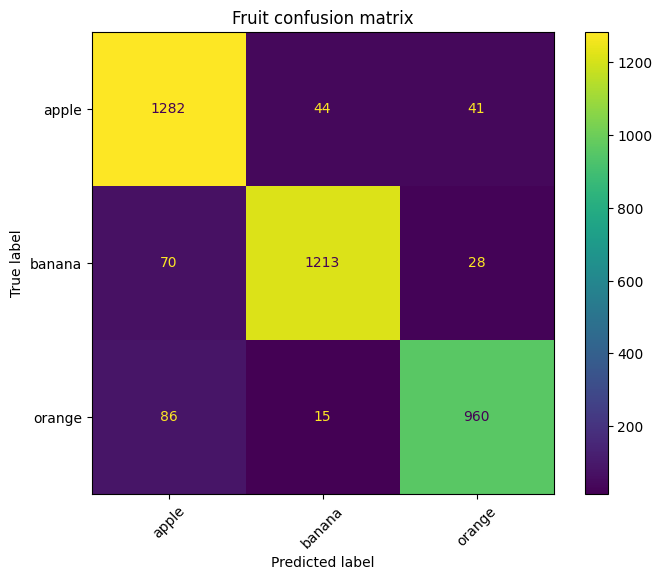


Stage classification (from regression score)
--------------------------------------------
Accuracy:  0.9500
Precision: 0.9493 (macro)
Recall:    0.9533 (macro)
F1-score:  0.9508 (macro)

Classification report (per class):
              precision    recall  f1-score   support

       fresh       0.90      0.96      0.93      1164
      unripe       0.97      0.97      0.97      1041
      rotten       0.98      0.93      0.95      1534

    accuracy                           0.95      3739
   macro avg       0.95      0.95      0.95      3739
weighted avg       0.95      0.95      0.95      3739



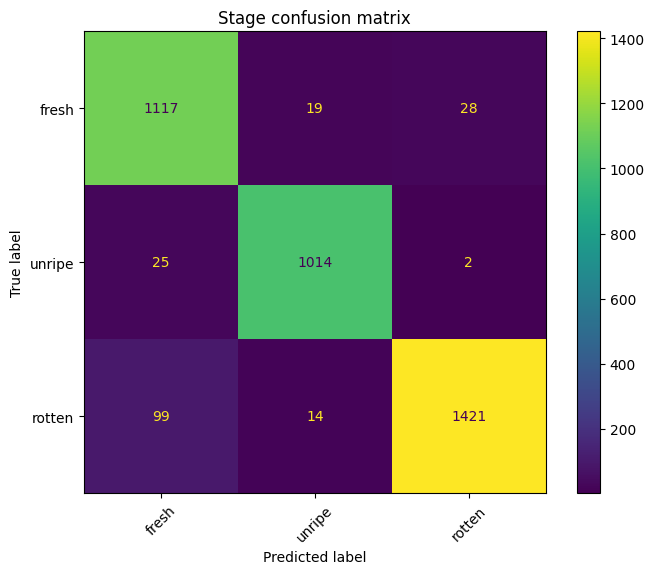

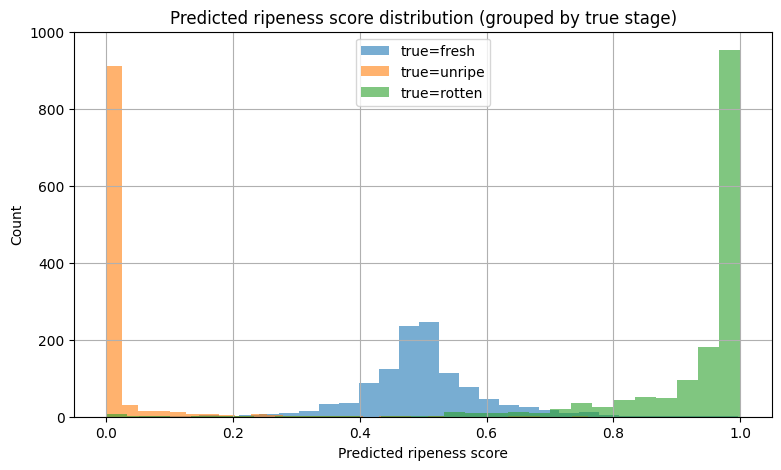

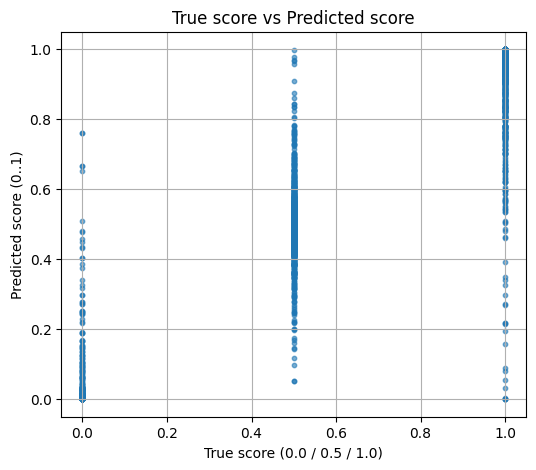

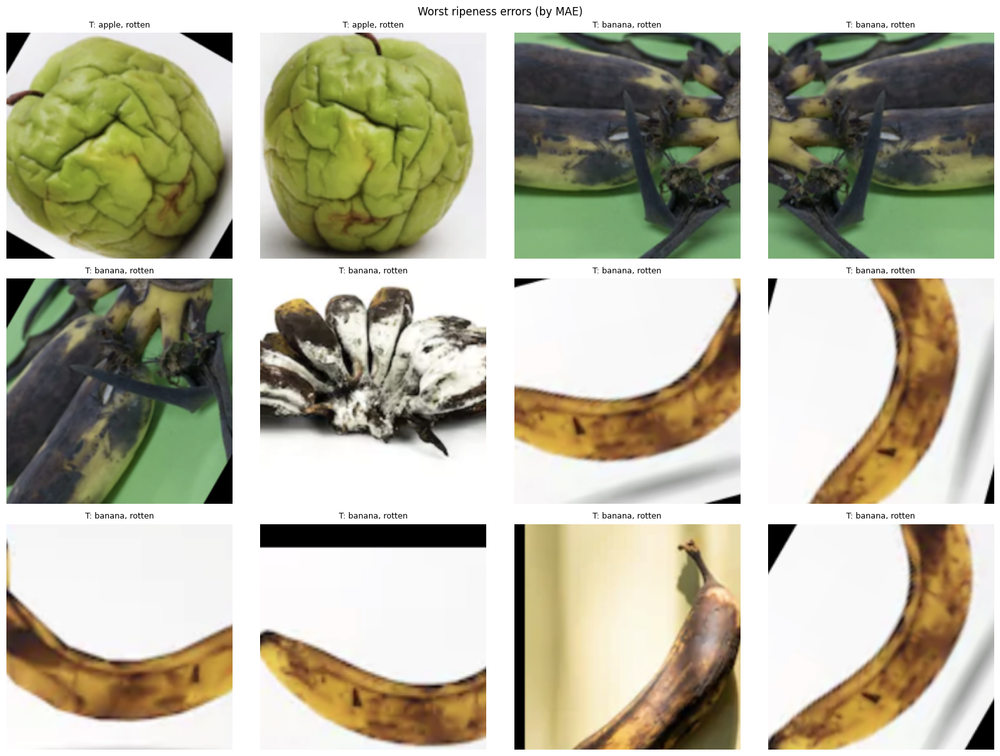

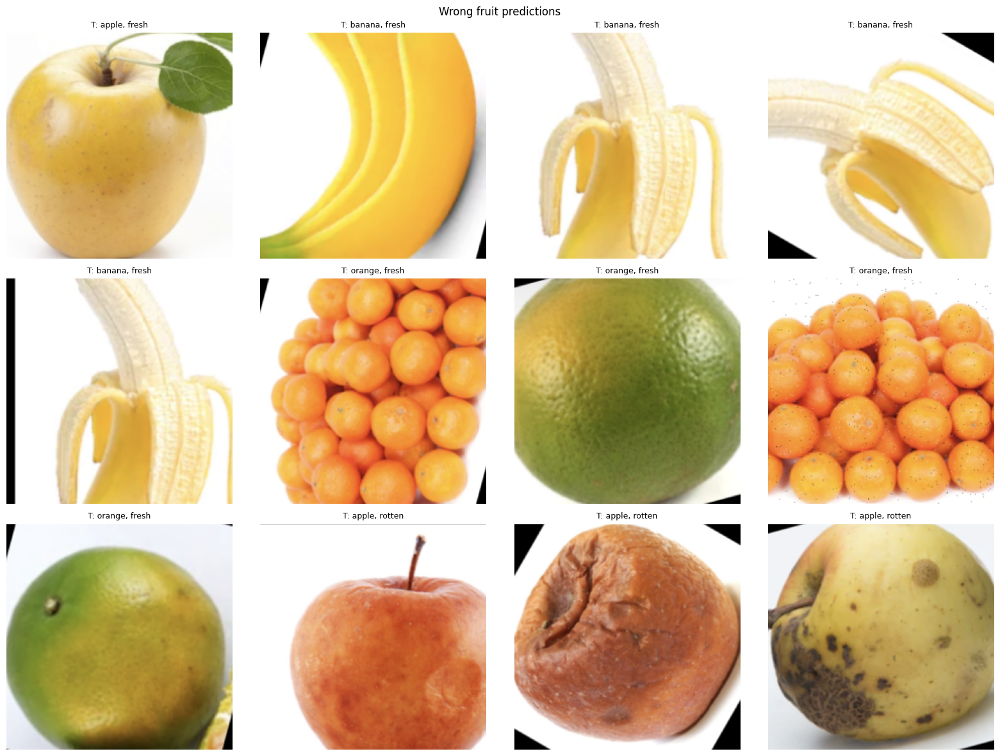

In [32]:
def test_baseline(BEST_PATH):
    EPOCHS = 10
    ALPHA = 1.0
    LR = 1e-3
    
    model, test_metrics, device, stage_id_to_score = fit_model(
        train_loader=train_loader,
        val_loader=val_loader,
        test_loader=test_loader,
        fruits=FRUITS,
        stages=STAGES,
        epochs=EPOCHS,
        alpha=ALPHA,
        lr=LR,
        best_path=BEST_PATH
    )
    
    
    # make sure test_loader is shuffle=False 
    outputs = evaluate_report_ready_regression(
        model=model,
        test_loader=test_loader,
        device=device,
        stage_id_to_score=stage_id_to_score,
        fruits=FRUITS,
        stages=STAGES,
        inv_norm=INV_NORM
    )

    return model, outputs


baseline_path = "baseline_model.pth"
baseline_model, baseline_outputs = test_baseline(baseline_path)

# Building Advanced CNN with Backbone

In [27]:
class AdvancedCNN(nn.Module):
    """
    Multi-task CNN using a pretrained backbone.

    Tasks:
        - Fruit classification (categorical)
        - Ripeness regression (continuous score in [0, 1])

    Design:
        - Pretrained CNN as feature extractor
        - Two task-specific heads
    """
    def __init__(self, num_fruits=3):
        super().__init__()

        # Pretrained ResNet18 backbone
        backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

        # Remove final classification layer
        self.backbone = nn.Sequential(*list(backbone.children())[:-1])

        feat_dim = backbone.fc.in_features  # 512 for ResNet18

        # Fruit classification head
        self.fruit_head = nn.Sequential(
            nn.Linear(feat_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, num_fruits)
        )

        # Ripeness regression head
        self.ripeness_head = nn.Sequential(
            nn.Linear(feat_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # Feature extraction
        feats = self.backbone(x)
        feats = feats.view(feats.size(0), -1)

        fruit_logits = self.fruit_head(feats)
        ripeness = self.ripeness_head(feats).squeeze(1)

        return fruit_logits, ripeness


# Helpers to Freeze and Unfreeze layers to improve learning
def freeze_backbone(model):
    """
    Freeze the pretrained feature extractor.
    """
    for p in model.backbone.parameters():
        p.requires_grad = False

def unfreeze_last_block(model):
    """
    Unfreeze top ResNet block for fine-tuning.
    """
    for p in model.backbone[-1].parameters():
        p.requires_grad = True


# Training the new model in phases


[Phase A] Epoch 1/4


Train: loss=0.335, fruit_acc=0.867, stage_acc=0.835, mae=0.130, joint_acc=0.725
Val  : loss=0.222, fruit_acc=0.911, stage_acc=0.923, mae=0.083, joint_acc=0.835
Saved best model (Phase A)

[Phase A] Epoch 2/4


Train: loss=0.234, fruit_acc=0.911, stage_acc=0.928, mae=0.074, joint_acc=0.844
Val  : loss=0.160, fruit_acc=0.938, stage_acc=0.957, mae=0.051, joint_acc=0.895
Saved best model (Phase A)

[Phase A] Epoch 3/4


Train: loss=0.212, fruit_acc=0.917, stage_acc=0.942, mae=0.058, joint_acc=0.862
Val  : loss=0.172, fruit_acc=0.931, stage_acc=0.928, mae=0.060, joint_acc=0.862

[Phase A] Epoch 4/4


Train: loss=0.199, fruit_acc=0.922, stage_acc=0.943, mae=0.054, joint_acc=0.869
Val  : loss=0.128, fruit_acc=0.945, stage_acc=0.963, mae=0.041, joint_acc=0.909
Saved best model (Phase A)

[Phase B] Epoch 1/6


Train: loss=0.166, fruit_acc=0.934, stage_acc=0.961, mae=0.039, joint_acc=0.897
Val  : loss=0.114, fruit_acc=0.951, stage_acc=0.955, mae=0.039, joint_acc=0.907

[Phase B] Epoch 2/6


Train: loss=0.162, fruit_acc=0.938, stage_acc=0.964, mae=0.035, joint_acc=0.904
Val  : loss=0.125, fruit_acc=0.948, stage_acc=0.943, mae=0.044, joint_acc=0.894

[Phase B] Epoch 3/6


Train: loss=0.157, fruit_acc=0.939, stage_acc=0.967, mae=0.034, joint_acc=0.908
Val  : loss=0.109, fruit_acc=0.955, stage_acc=0.966, mae=0.030, joint_acc=0.922
Saved best model (Phase B)

[Phase B] Epoch 4/6


Train: loss=0.148, fruit_acc=0.942, stage_acc=0.967, mae=0.032, joint_acc=0.912
Val  : loss=0.108, fruit_acc=0.956, stage_acc=0.951, mae=0.037, joint_acc=0.907

[Phase B] Epoch 5/6


Train: loss=0.149, fruit_acc=0.940, stage_acc=0.966, mae=0.032, joint_acc=0.908
Val  : loss=0.102, fruit_acc=0.957, stage_acc=0.966, mae=0.029, joint_acc=0.923
Saved best model (Phase B)

[Phase B] Epoch 6/6


Train: loss=0.141, fruit_acc=0.945, stage_acc=0.970, mae=0.030, joint_acc=0.917
Val  : loss=0.101, fruit_acc=0.959, stage_acc=0.966, mae=0.030, joint_acc=0.925
Saved best model (Phase B)



Advanced test results:
Test: loss=0.099, fruit_acc=0.963, stage_acc=0.966, mae=0.032, joint_acc=0.931



Fruit classification
--------------------
Accuracy:  0.9631
Precision: 0.9617 (macro)
Recall:    0.9633 (macro)
F1-score:  0.9624 (macro)

Classification report (per class):
              precision    recall  f1-score   support

       apple       0.97      0.94      0.95      1367
      banana       0.98      0.99      0.98      1311
      orange       0.94      0.96      0.95      1061

    accuracy                           0.96      3739
   macro avg       0.96      0.96      0.96      3739
weighted avg       0.96      0.96      0.96      3739



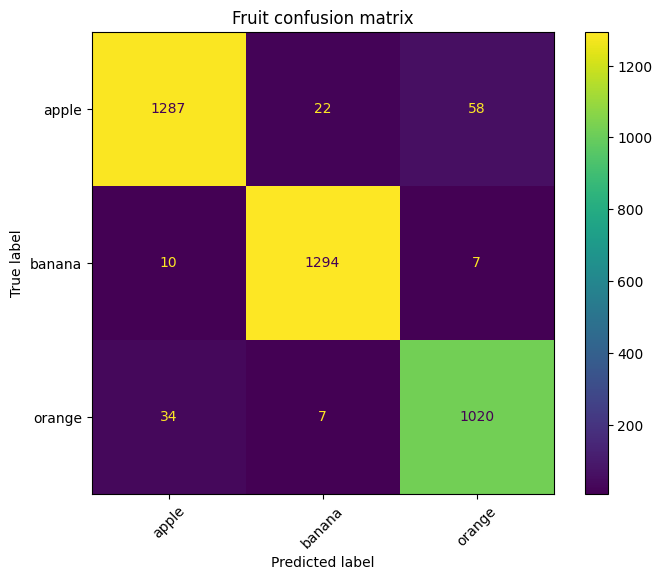


Stage classification (from regression score)
--------------------------------------------
Accuracy:  0.9655
Precision: 0.9641 (macro)
Recall:    0.9686 (macro)
F1-score:  0.9661 (macro)

Classification report (per class):
              precision    recall  f1-score   support

       fresh       0.94      0.96      0.95      1164
      unripe       0.97      1.00      0.98      1041
      rotten       0.99      0.95      0.97      1534

    accuracy                           0.97      3739
   macro avg       0.96      0.97      0.97      3739
weighted avg       0.97      0.97      0.97      3739



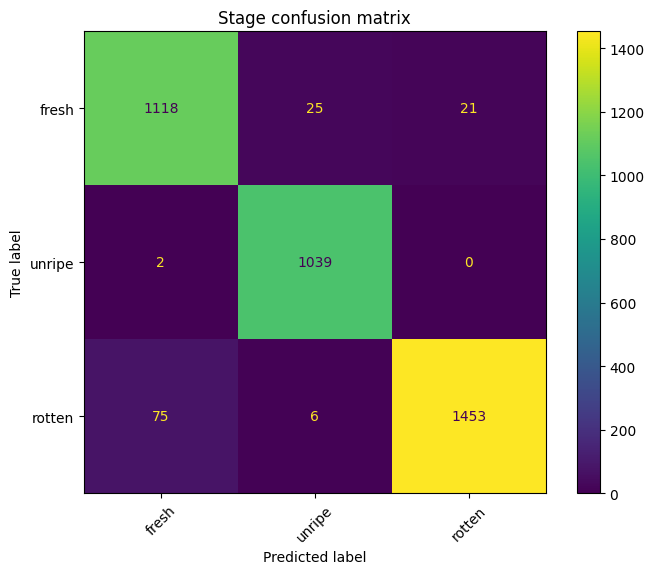

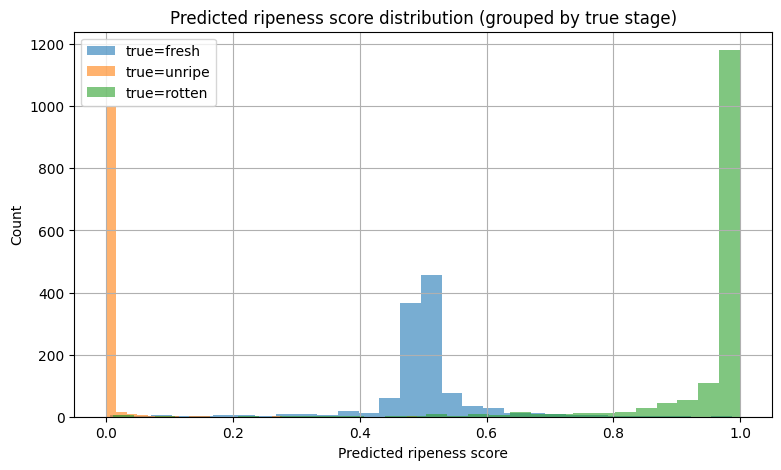

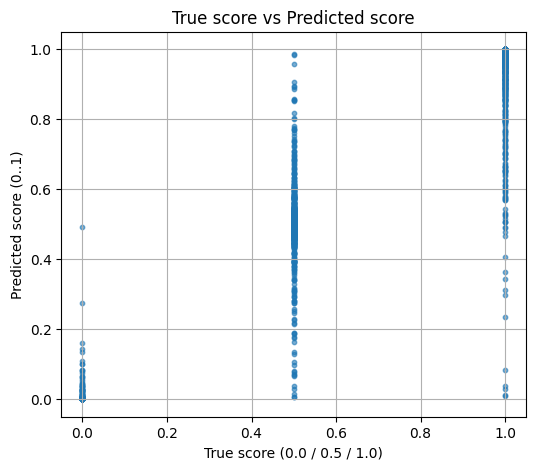

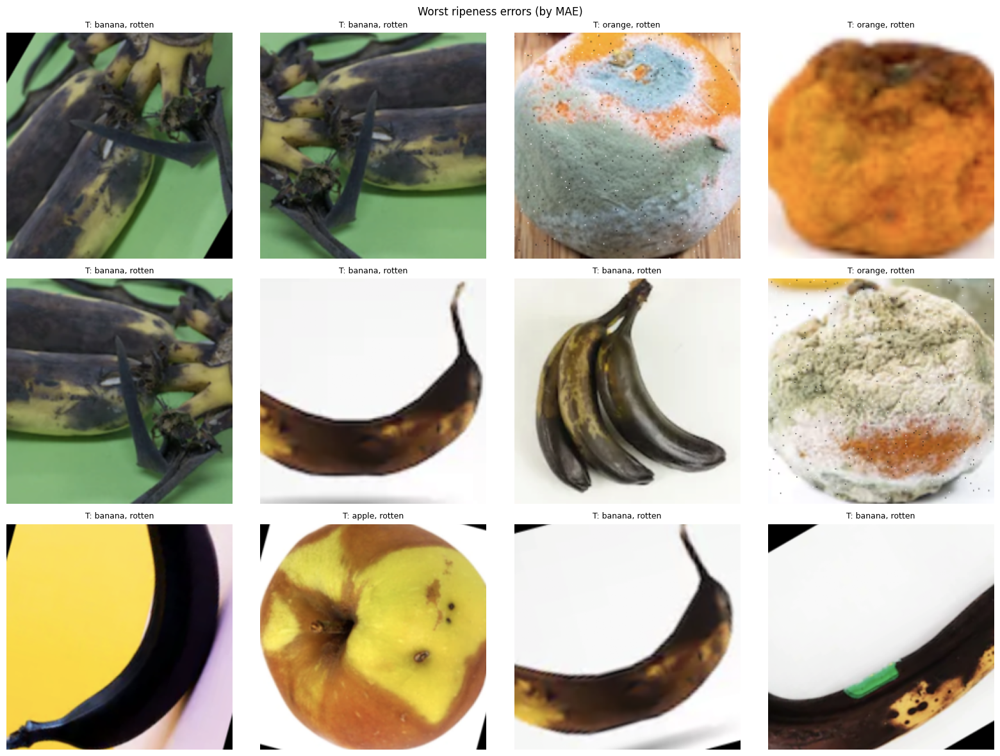

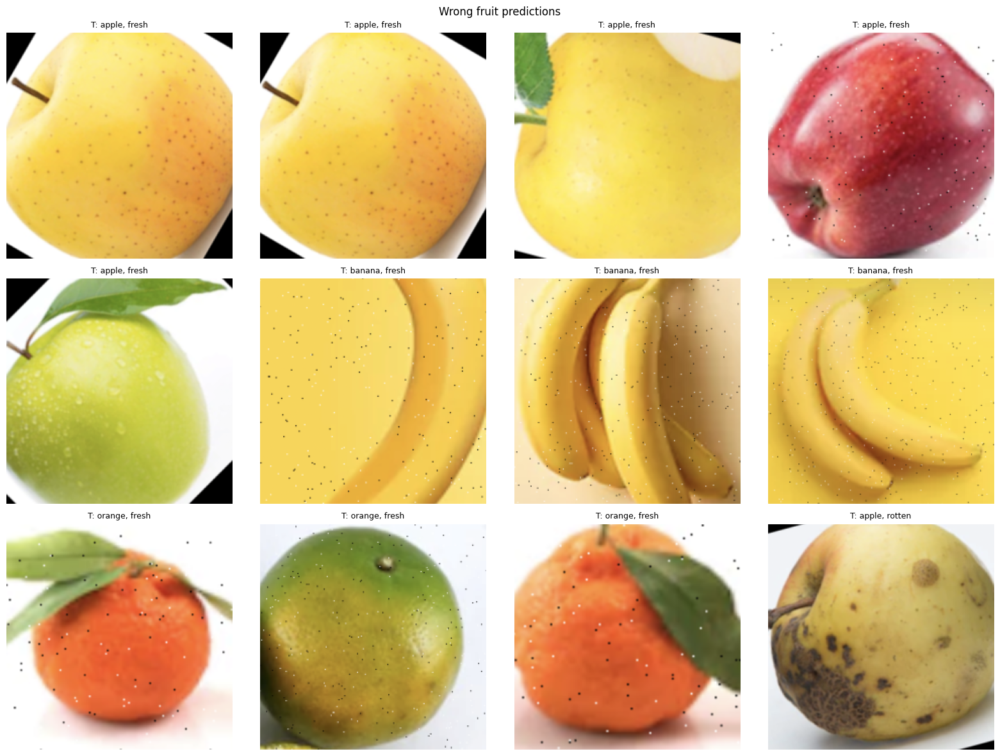

In [31]:
def test_advanced(path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = AdvancedCNN(num_fruits=len(FRUITS)).to(device)
    freeze_backbone(model)  # freeze backbone initially

    loss_fruit = nn.CrossEntropyLoss()
    loss_reg   = nn.MSELoss()

    ALPHA = 0.3  # regression weight
    stage_id_to_score = make_stage_id_to_score(STAGES, device)

    best_val_joint = -1.0

    # -------------------------
    # Phase A: train heads only
    # -------------------------
    optimizer = torch.optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=1e-3
    )

    EPOCHS_A = 4
    for epoch in range(EPOCHS_A):
        print(f"\n[Phase A] Epoch {epoch+1}/{EPOCHS_A}")

        train_m = run_one_epoch(
            model, train_loader, device, stage_id_to_score,
            loss_fruit, loss_reg, alpha=ALPHA,
            optimizer=optimizer, desc="Train"
        )

        val_m = run_one_epoch(
            model, val_loader, device, stage_id_to_score,
            loss_fruit, loss_reg, alpha=ALPHA,
            optimizer=None, desc="Val"
        )

        print_metrics("Train", train_m)
        print_metrics("Val  ", val_m)

        if val_m["joint_acc"] > best_val_joint:
            best_val_joint = val_m["joint_acc"]
            torch.save(model.state_dict(), path)
            print("Saved best model (Phase A)")

    # -------------------------
    # Phase B: fine-tune backbone
    # -------------------------
    unfreeze_last_block(model)

    optimizer = torch.optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=3e-4
    )

    EPOCHS_B = 6
    for epoch in range(EPOCHS_B):
        print(f"\n[Phase B] Epoch {epoch+1}/{EPOCHS_B}")

        train_m = run_one_epoch(
            model, train_loader, device, stage_id_to_score,
            loss_fruit, loss_reg, alpha=ALPHA,
            optimizer=optimizer, desc="Train"
        )

        val_m = run_one_epoch(
            model, val_loader, device, stage_id_to_score,
            loss_fruit, loss_reg, alpha=ALPHA,
            optimizer=None, desc="Val"
        )

        print_metrics("Train", train_m)
        print_metrics("Val  ", val_m)

        if val_m["joint_acc"] > best_val_joint:
            best_val_joint = val_m["joint_acc"]
            torch.save(model.state_dict(), path)
            print("Saved best model (Phase B)")

    # -------------------------
    # Test evaluation (baseline-style)
    # -------------------------
    model.load_state_dict(torch.load(path, map_location=device))

    test_m = run_one_epoch(
        model, test_loader, device, stage_id_to_score,
        loss_fruit, loss_reg, alpha=ALPHA,
        optimizer=None, desc="Test"
    )

    print("\nAdvanced test results:")
    print_metrics("Test", test_m)

    outputs = evaluate_report_ready_regression(
        model=model,
        test_loader=test_loader,
        device=device,
        stage_id_to_score=stage_id_to_score,
        fruits=FRUITS,
        stages=STAGES,
        inv_norm=INV_NORM
    )

    return model, outputs

advanced_path = "advanced_model.pth"
advanced_model, advanced_outputs = test_advanced(advanced_path)